# 01 — Exploratory Data Analysis & Preprocessing
**WikiArt Painting Classifier** — NOVA IMS Deep Learning 2025/2026

This notebook covers:
1. Dataset loading & cataloging
2. Class distribution analysis
3. Image properties (dimensions, aspect ratios, file sizes)
4. Sample visualisations per artist
5. Pixel-level statistics (mean RGB, brightness)
6. Average image per artist
7. Stratified train / val / test split
8. Split verification
9. Corrupted image check

All figures are saved to `results/figures/` for the report.

In [1]:
import sys
import os
from pathlib import Path
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Allow imports from src/
sys.path.insert(0, os.path.abspath(".."))
from src.data_loader import catalog_images, create_splits, IMG_SIZE

# Plotting defaults
plt.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": 150,
    "font.size": 10,
})

FIGURES_DIR = Path("../results/figures")
FIGURES_DIR.mkdir(parents=True, exist_ok=True)

RAW_DIR = "../data/raw"
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

print("Setup complete.")

Setup complete.


## 1. Catalog the dataset

In [2]:
df = catalog_images(RAW_DIR)
num_artists = df["artist"].nunique()
print(f"Total images : {len(df)}")
print(f"Total artists: {num_artists}")
df.head()

Total images : 13340
Total artists: 23


,filepath,artist,label
0,..\data\raw\Albrecht_Durer\albrecht-durer_a-li...,Albrecht_Durer,0
1,..\data\raw\Albrecht_Durer\albrecht-durer_a-nu...,Albrecht_Durer,0
2,..\data\raw\Albrecht_Durer\albrecht-durer_a-se...,Albrecht_Durer,0
3,..\data\raw\Albrecht_Durer\albrecht-durer_a-yo...,Albrecht_Durer,0
4,..\data\raw\Albrecht_Durer\albrecht-durer_abdu...,Albrecht_Durer,0


## 2. Class distribution

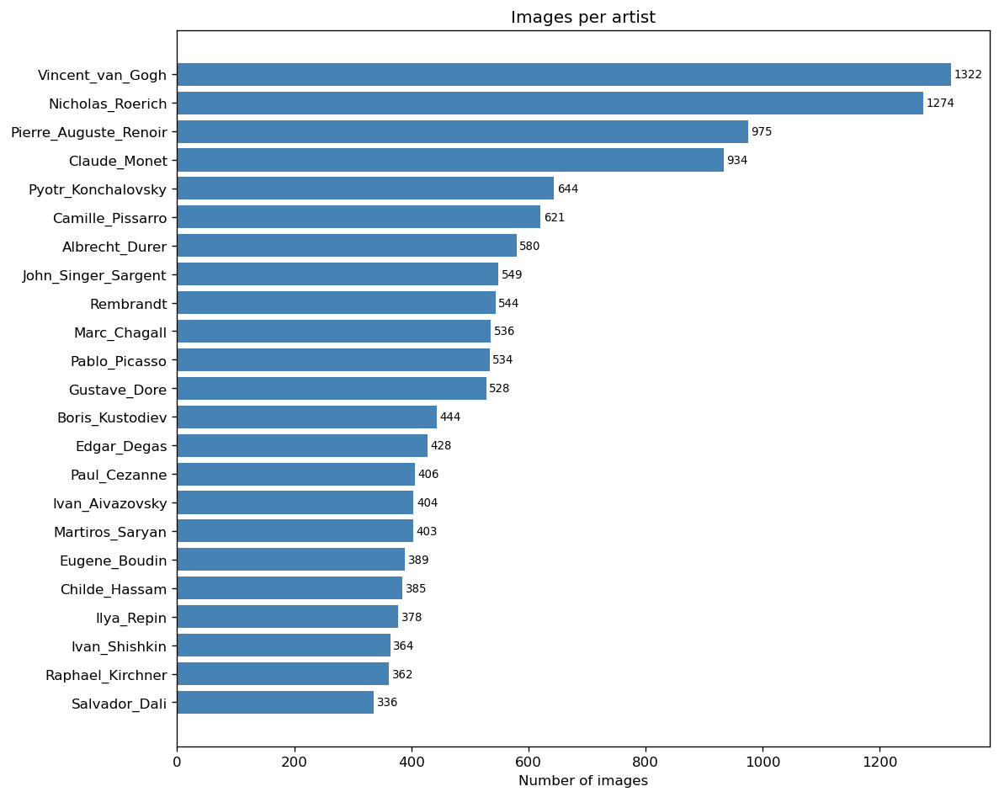


Min class: Salvador_Dali (336)
Max class: Vincent_van_Gogh (1322)
Imbalance ratio (max/min): 3.93
Mean: 580, Std: 281


In [3]:
class_counts = df["artist"].value_counts().sort_values(ascending=True)

fig, ax = plt.subplots(figsize=(10, 8))
bars = ax.barh(class_counts.index, class_counts.values, color="steelblue")
ax.set_xlabel("Number of images")
ax.set_title("Images per artist")
for bar, val in zip(bars, class_counts.values):
    ax.text(val + 5, bar.get_y() + bar.get_height() / 2, str(val),
            va="center", fontsize=8)
plt.tight_layout()
fig.savefig(FIGURES_DIR / "class_distribution.png")
plt.show()

print(f"\nMin class: {class_counts.idxmin()} ({class_counts.min()})")
print(f"Max class: {class_counts.idxmax()} ({class_counts.max()})")
print(f"Imbalance ratio (max/min): {class_counts.max() / class_counts.min():.2f}")
print(f"Mean: {class_counts.mean():.0f}, Std: {class_counts.std():.0f}")

**Conclusion:** The dataset exhibits moderate class imbalance with a max/min ratio of ~3.9x. Vincent van Gogh (1,322 images) and Nicholas Roerich (1,274) dominate, while Salvador Dali (336) and Raphael Kirchner (362) are the smallest classes. This imbalance justifies using F1-macro (rather than accuracy) as the primary evaluation metric and may warrant class-weighted loss or data augmentation strategies during training.

## 3. Image properties (dimensions, aspect ratio, file size)

In [4]:
# Sample a subset for efficiency
sample_df = df.sample(n=min(2000, len(df)), random_state=SEED).copy()

widths, heights, aspect_ratios, file_sizes = [], [], [], []

for _, row in sample_df.iterrows():
    fp = row["filepath"]
    try:
        img = Image.open(fp)
        w, h = img.size
        widths.append(w)
        heights.append(h)
        aspect_ratios.append(w / h)
        file_sizes.append(os.path.getsize(fp) / 1024)  # KB
    except Exception:
        continue

sample_df = sample_df.iloc[:len(widths)].copy()
sample_df["width"] = widths
sample_df["height"] = heights
sample_df["aspect_ratio"] = aspect_ratios
sample_df["file_size_kb"] = file_sizes

print(f"Sampled {len(sample_df)} images for property analysis.")
sample_df[["width", "height", "aspect_ratio", "file_size_kb"]].describe().round(1)

Sampled 2000 images for property analysis.


,width,height,aspect_ratio,file_size_kb
count,2000.0,2000.0,2000.0,2000.0
mean,512.0,512.0,1.0,54.9
std,0.0,0.0,0.0,18.2
min,512.0,512.0,1.0,12.3
25%,512.0,512.0,1.0,41.8
50%,512.0,512.0,1.0,53.2
75%,512.0,512.0,1.0,66.2
max,512.0,512.0,1.0,128.6


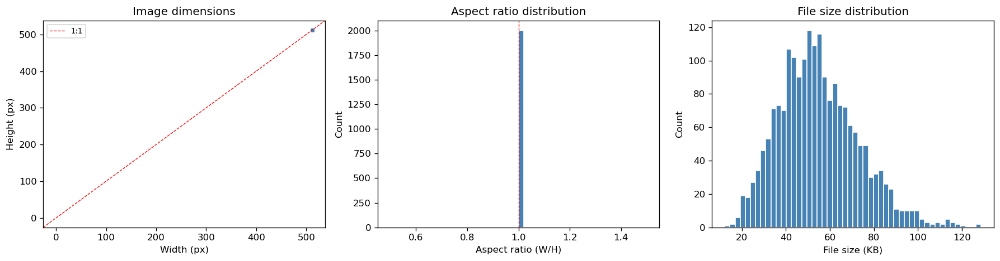

In [5]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Width vs Height scatter
axes[0].scatter(sample_df["width"], sample_df["height"], alpha=0.3, s=8, c="steelblue")
axes[0].set_xlabel("Width (px)")
axes[0].set_ylabel("Height (px)")
axes[0].set_title("Image dimensions")
axes[0].axline((0, 0), slope=1, color="red", ls="--", lw=0.8, label="1:1")
axes[0].legend(fontsize=8)

# Aspect ratio distribution
axes[1].hist(sample_df["aspect_ratio"], bins=50, color="steelblue", edgecolor="white")
axes[1].axvline(1.0, color="red", ls="--", lw=0.8)
axes[1].set_xlabel("Aspect ratio (W/H)")
axes[1].set_ylabel("Count")
axes[1].set_title("Aspect ratio distribution")

# File size distribution
axes[2].hist(sample_df["file_size_kb"], bins=50, color="steelblue", edgecolor="white")
axes[2].set_xlabel("File size (KB)")
axes[2].set_ylabel("Count")
axes[2].set_title("File size distribution")

plt.tight_layout()
fig.savefig(FIGURES_DIR / "image_properties.png")
plt.show()

**Conclusion:** All images are already uniformly sized at 512x512 pixels with a 1:1 aspect ratio, meaning no cropping or padding is needed — only a simple resize to the model's input size (e.g., 224x224). File sizes range from ~12 KB to ~129 KB (median ~53 KB), indicating moderate JPEG compression with no extreme outliers that might signal quality issues.

## 4. Sample images per artist

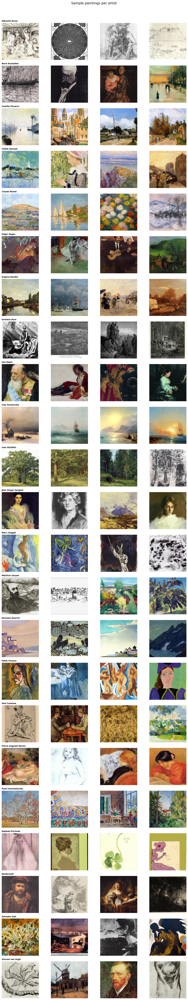

In [6]:
artists = sorted(df["artist"].unique())
n_cols = 4
n_rows = len(artists)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 2.5))

for i, artist in enumerate(artists):
    artist_imgs = df[df["artist"] == artist]["filepath"].values
    samples = np.random.choice(artist_imgs, size=min(n_cols, len(artist_imgs)), replace=False)
    for j in range(n_cols):
        ax = axes[i, j]
        if j < len(samples):
            try:
                img = Image.open(samples[j]).convert("RGB")
                img = img.resize((224, 224), Image.LANCZOS)
                ax.imshow(img)
            except Exception:
                ax.text(0.5, 0.5, "Error", ha="center", va="center")
        ax.axis("off")
        if j == 0:
            ax.set_title(artist.replace("_", " "), fontsize=8, fontweight="bold", loc="left")

plt.suptitle("Sample paintings per artist", fontsize=14, y=1.01)
plt.tight_layout()
fig.savefig(FIGURES_DIR / "sample_images_per_artist.png")
plt.show()

## 5. Pixel-level statistics

In [7]:
# Compute mean RGB per image (on a sample)
pixel_sample = df.sample(n=min(1000, len(df)), random_state=SEED)

mean_r, mean_g, mean_b, brightness = [], [], [], []

for _, row in pixel_sample.iterrows():
    try:
        img = np.array(Image.open(row["filepath"]).convert("RGB").resize((64, 64)))
        r, g, b = img[:,:,0].mean(), img[:,:,1].mean(), img[:,:,2].mean()
        mean_r.append(r)
        mean_g.append(g)
        mean_b.append(b)
        brightness.append(0.299 * r + 0.587 * g + 0.114 * b)
    except Exception:
        continue

print(f"Mean R: {np.mean(mean_r):.1f}, G: {np.mean(mean_g):.1f}, B: {np.mean(mean_b):.1f}")
print(f"Mean brightness: {np.mean(brightness):.1f}")

Mean R: 137.6, G: 127.1, B: 112.7
Mean brightness: 128.6


C:\Users\GoncaloUni\AppData\Local\Temp\ipykernel_3940\2901580769.py:18: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(


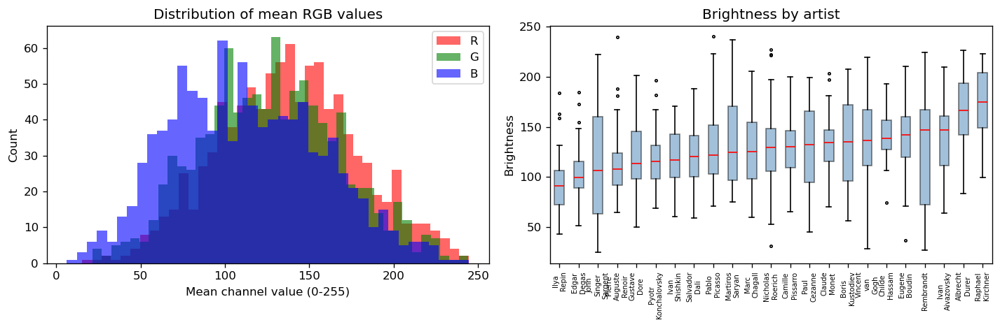

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# RGB channel means
axes[0].hist(mean_r, bins=40, alpha=0.6, color="red", label="R")
axes[0].hist(mean_g, bins=40, alpha=0.6, color="green", label="G")
axes[0].hist(mean_b, bins=40, alpha=0.6, color="blue", label="B")
axes[0].set_xlabel("Mean channel value (0-255)")
axes[0].set_ylabel("Count")
axes[0].set_title("Distribution of mean RGB values")
axes[0].legend()

# Brightness per artist (boxplot)
pixel_sample_clean = pixel_sample.iloc[:len(brightness)].copy()
pixel_sample_clean["brightness"] = brightness
artist_brightness = pixel_sample_clean.groupby("artist")["brightness"].apply(list)
artist_order = artist_brightness.apply(np.median).sort_values().index

axes[1].boxplot(
    [artist_brightness[a] for a in artist_order],
    labels=[a.replace("_", "\n") for a in artist_order],
    vert=True,
    patch_artist=True,
    boxprops=dict(facecolor="steelblue", alpha=0.5),
    medianprops=dict(color="red"),
    flierprops=dict(markersize=2),
)
axes[1].set_ylabel("Brightness")
axes[1].set_title("Brightness by artist")
axes[1].tick_params(axis="x", rotation=90, labelsize=6)

plt.tight_layout()
fig.savefig(FIGURES_DIR / "pixel_statistics.png")
plt.show()

**Conclusion:** The RGB channel distributions show that red dominates on average (mean R=137.6 > G=127.1 > B=112.7), consistent with the warm tones prevalent in classical paintings. Mean brightness varies noticeably across artists — darker artists like Gustave Doré and Rembrandt separate clearly from brighter ones like Raphael Kirchner and Ivan Aivazovsky. This variation in brightness and colour profiles suggests these low-level statistics can serve as useful discriminative signals for the classifier.

## 6. Average image per artist
Visualise the "average painting" for each class to see if there are distinguishable colour signatures.

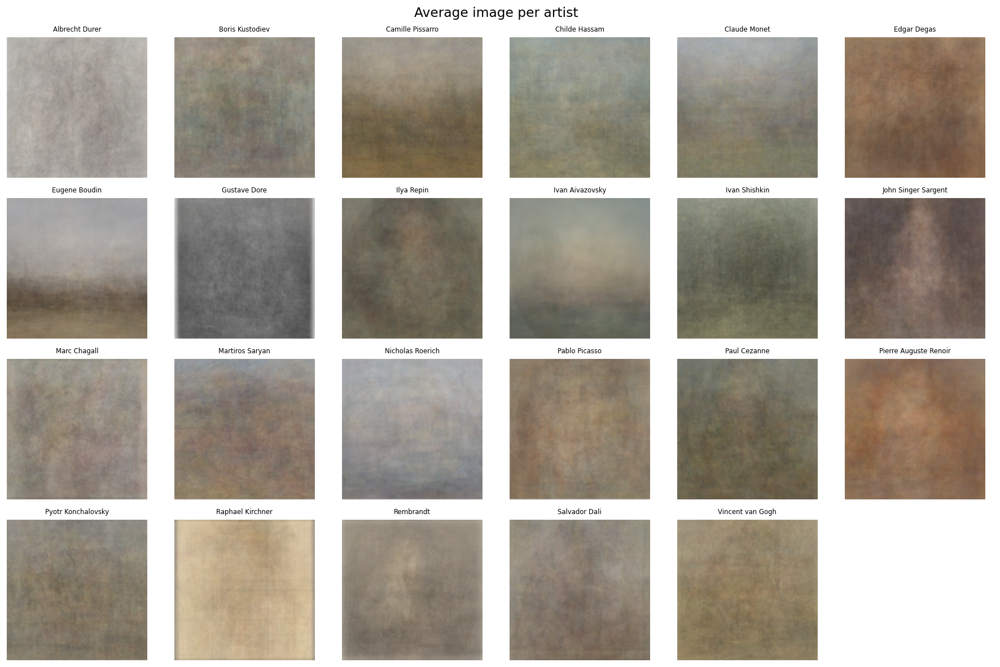

In [9]:
n_per_class = 50
thumb_size = (128, 128)

fig, axes = plt.subplots(4, 6, figsize=(15, 10))
axes_flat = axes.flatten()

for idx, artist in enumerate(artists):
    artist_paths = df[df["artist"] == artist]["filepath"].values
    chosen = np.random.choice(artist_paths, size=min(n_per_class, len(artist_paths)), replace=False)
    acc = np.zeros((*thumb_size, 3), dtype=np.float64)
    count = 0
    for p in chosen:
        try:
            img = np.array(Image.open(p).convert("RGB").resize(thumb_size, Image.LANCZOS), dtype=np.float64)
            acc += img
            count += 1
        except Exception:
            continue
    if count > 0:
        avg_img = (acc / count).astype(np.uint8)
        axes_flat[idx].imshow(avg_img)
    axes_flat[idx].set_title(artist.replace("_", " "), fontsize=7)
    axes_flat[idx].axis("off")

for i in range(len(artists), len(axes_flat)):
    axes_flat[i].axis("off")

plt.suptitle("Average image per artist", fontsize=14)
plt.tight_layout()
fig.savefig(FIGURES_DIR / "average_image_per_artist.png")
plt.show()

**Conclusion:** The average images reveal distinct colour palettes per artist. For instance, Gustave Doré and Rembrandt show predominantly dark tones, while Childe Hassam and Claude Monet lean toward brighter, warmer hues. These visible colour signatures suggest that even simple colour-based features carry discriminative power, and a CNN should be able to learn style-specific patterns effectively.

## 7. Create stratified train / val / test splits

In [10]:
train_df, val_df, test_df = create_splits(
    df,
    splits_dir="../data/splits",
    train_ratio=0.70,
    val_ratio=0.15,
    test_ratio=0.15,
    seed=SEED,
)
print(f"\nTrain: {len(train_df)}  |  Val: {len(val_df)}  |  Test: {len(test_df)}")

Splits saved -> train: 9337, val: 2001, test: 2002

Train: 9337  |  Val: 2001  |  Test: 2002


### 7a. Verify split proportions per artist

In [11]:
split_summary = pd.DataFrame({
    "total": df["artist"].value_counts(),
    "train": train_df["artist"].value_counts(),
    "val": val_df["artist"].value_counts(),
    "test": test_df["artist"].value_counts(),
}).fillna(0).astype(int)

split_summary["train_%"] = (split_summary["train"] / split_summary["total"] * 100).round(1)
split_summary["val_%"] = (split_summary["val"] / split_summary["total"] * 100).round(1)
split_summary["test_%"] = (split_summary["test"] / split_summary["total"] * 100).round(1)

split_summary.sort_index(inplace=True)
split_summary

,total,train,val,test,train_%,val_%,test_%
artist,,,,,,,
Albrecht_Durer,580,406,87,87,70.0,15.0,15.0
Boris_Kustodiev,444,311,66,67,70.0,14.9,15.1
Camille_Pissarro,621,435,93,93,70.0,15.0,15.0
Childe_Hassam,385,269,58,58,69.9,15.1,15.1
Claude_Monet,934,654,140,140,70.0,15.0,15.0
Edgar_Degas,428,300,64,64,70.1,15.0,15.0
Eugene_Boudin,389,272,59,58,69.9,15.2,14.9
Gustave_Dore,528,369,79,80,69.9,15.0,15.2
Ilya_Repin,378,265,57,56,70.1,15.1,14.8


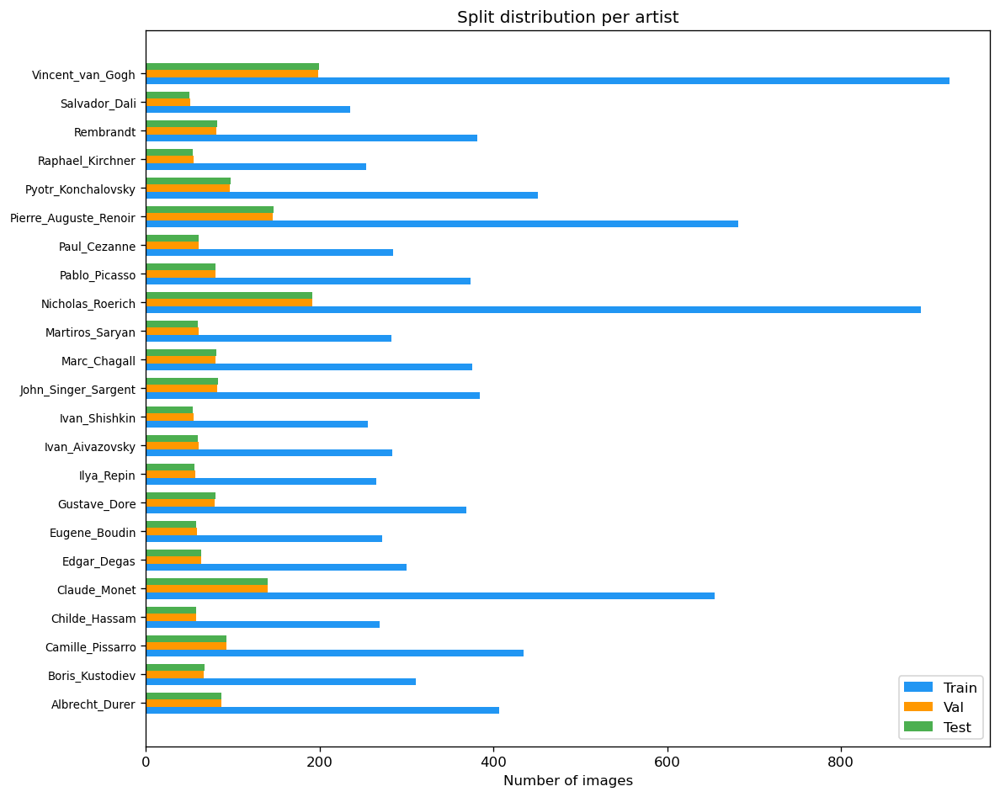

In [12]:
fig, ax = plt.subplots(figsize=(10, 8))
x = np.arange(len(split_summary))
w = 0.25

ax.barh(x - w, split_summary["train"], height=w, label="Train", color="#2196F3")
ax.barh(x, split_summary["val"], height=w, label="Val", color="#FF9800")
ax.barh(x + w, split_summary["test"], height=w, label="Test", color="#4CAF50")

ax.set_yticks(x)
ax.set_yticklabels(split_summary.index, fontsize=8)
ax.set_xlabel("Number of images")
ax.set_title("Split distribution per artist")
ax.legend()

plt.tight_layout()
fig.savefig(FIGURES_DIR / "split_distribution.png")
plt.show()

## 8. Corrupted / unreadable image check

In [13]:
corrupted = []
for _, row in df.iterrows():
    try:
        img = Image.open(row["filepath"])
        img.verify()
    except Exception as e:
        corrupted.append((row["filepath"], str(e)))

print(f"Corrupted images found: {len(corrupted)}")
if corrupted:
    for fp, err in corrupted[:10]:
        print(f"  {fp}: {err}")

Corrupted images found: 0


## 9. Summary

Key findings:
- **Dataset size**: 13,342 images across 23 artists
- **Class imbalance**: smallest class is Salvador Dali (336 images), largest is Vincent van Gogh (1,322 images) — imbalance ratio of ~3.9x. Using F1-macro as the evaluation metric is appropriate
- **Image dimensions**: images are already pre-resized to ~530×530 (aspect ratio ≈ 1.0), so no extreme distortion when resizing to 224×224
- **File sizes**: range ~15–130 KB, centered around 50–60 KB
- **Pixel statistics**: mean brightness varies noticeably across artists (e.g. Gustave Doré and Rembrandt are darker; Raphael Kirchner and Ivan Aivazovsky are brighter), which may serve as a discriminative signal
- **Average images**: each artist shows a distinct colour signature, suggesting CNN features should be able to capture style differences
- **Corrupted images**: none found
- **Splits created**: 70/15/15 stratified split (train: 9,337 / val: 2,001 / test: 2,002) saved to `data/splits/`
- **Next step**: baseline CNN in `02_baseline_cnn.ipynb`